In [1]:
import matplotlib.pyplot as plt
from astropy.nddata import CCDData
from astropy.io import fits
from ccdproc import *
from astropy.visualization import hist
import numpy as np
import sys
np.set_printoptions(threshold=sys.maxsize)
from pathlib import Path
from convenience_functions import show_image

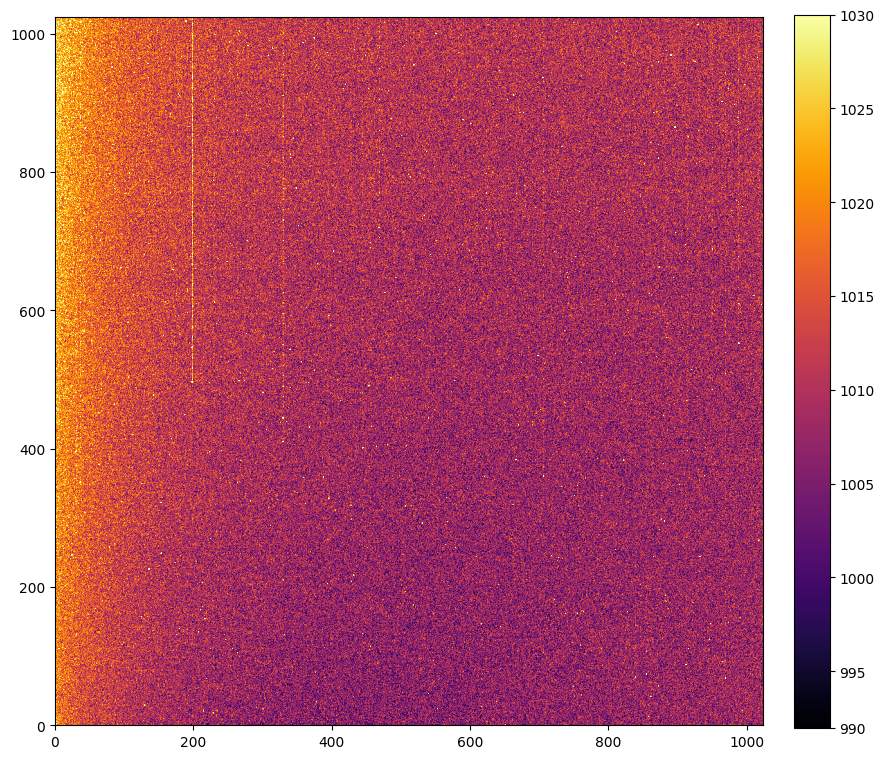

In [2]:
#Plot image
bias_image = CCDData.read('bias_frame.00000000.BIAS.FIT', unit='adu')
show_image(bias_image.data, cmap='inferno')

[]

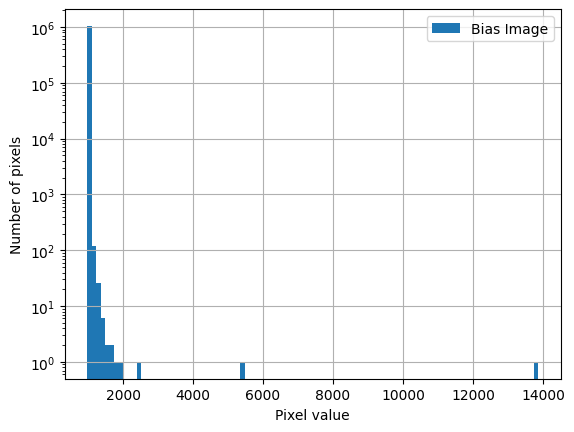

In [3]:
#Plot Histogram
data = bias_image.data.flatten()
hist(data, bins=100, label='Bias Image')
plt.grid()
plt.legend()
plt.xlabel('Pixel value')
plt.ylabel('Number of pixels')
plt.semilogy() #y-axis in log-scale

Text(0, 0.5, 'Number of pixels')

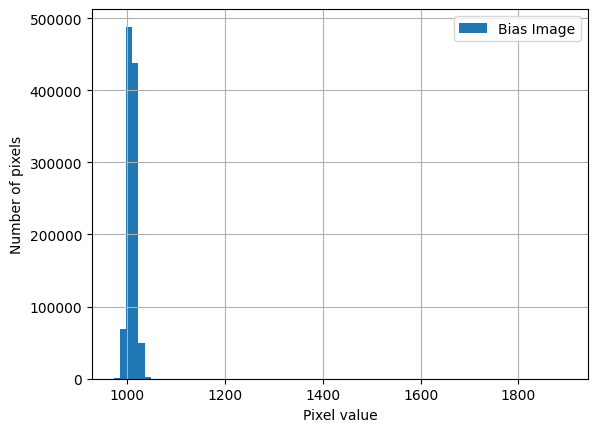

In [4]:
#Plot Cut Histogram 
data_cut = data[data<2000]
hist(data_cut, bins=75, label='Bias Image')
plt.grid()
plt.legend()
plt.xlabel('Pixel value')
plt.ylabel('Number of pixels')

In [34]:
#Fraction of Pixels that get reject
count = 0
for i in range(len(data)):
    if bias_image.data.flatten()[i] > 1060:
        count = count + 1
print(f"The fraction of pixels that got rejected is {count / len(data)}")

KeyboardInterrupt: 

In [5]:
#Calculate the standard deviation and mean for Gaussian Curve
std = np.std(data_cut)
print(f'standard deviation is {std}')
mean = np.mean(data_cut)
print(f'mean is {mean}')
uncert = std/(1024)
print(f'uncertainity is: {uncert}')

standard deviation is 8.499324106312372
mean is 1010.1403488359895
uncertainity is: 0.008300121197570676


In [6]:
#Define the Gaussian Function
def g(sigma,u,x):
    return 1/(sigma*(np.sqrt(2*np.pi))) * np.exp(-(x - u)**2 / (2*sigma**2))

Text(0, 0.5, 'Number of pixels')

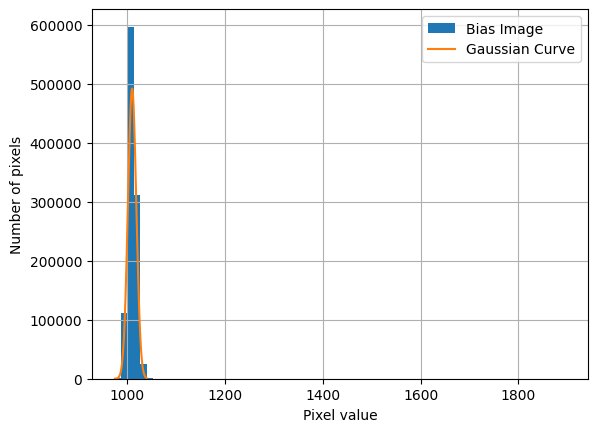

In [7]:
#Plot Cut Histogram with Gaussian Fit
x = np.linspace(975,1040,1040)
hist(data_cut, bins=70, label='Bias Image')
plt.plot(x, 10485760*g(std,mean,x), label='Gaussian Curve')
plt.grid()
plt.legend()
plt.xlabel('Pixel value')
plt.ylabel('Number of pixels')

$$\text{read noise} = \frac{\sigma \times \text{gain}}{\sqrt{2}}$$

In [8]:
#Bias method for read noise
bias_data_cut = data_cut
read_noise = np.std(bias_data_cut) * 2.06/ np.sqrt(2)
print(f"Read noise in units of electrons: {read_noise}")

Read noise in units of electrons: 12.380455204816089


In [7]:
#Combining 10 dark images with 30s exposure time and finding median
ccd1 = CCDData.read('dark_frame_30s.06.DARK.FIT', unit='adu')
ccd2 = CCDData.read('dark_frame_30s.07.DARK.FIT', unit='adu')
ccd3 = CCDData.read('dark_frame_30s.08.DARK.FIT', unit='adu')
ccd4 = CCDData.read('dark_frame_30s.09.DARK.FIT', unit='adu')
ccd5 = CCDData.read('dark_frame_30s.10.DARK.FIT', unit='adu')
ccd6 = CCDData.read('dark_frame_30s.11.DARK.FIT', unit='adu')
ccd7 = CCDData.read('dark_frame_30s.12.DARK.FIT', unit='adu')
ccd8 = CCDData.read('dark_frame_30s.13.DARK.FIT', unit='adu')
ccd9 = CCDData.read('dark_frame_30s.14.DARK.FIT', unit='adu')
ccd10 = CCDData.read('dark_frame_30s.15.DARK.FIT', unit='adu')

combiner = Combiner([ccd1, ccd2, ccd3, ccd4, ccd5, ccd6, ccd7, ccd8, ccd9, ccd10])
combined_median = np.array(combiner.median_combine())

In [10]:
#Making new FIT file from median array
hdu = fits.PrimaryHDU(combined_median)
hdul = fits.HDUList([hdu])
hdu.writeto('master_dark_frame_30s.DARK.FIT')

OSError: File master_dark_frame_30s.DARK.FIT already exists. If you mean to replace it then use the argument "overwrite=True".

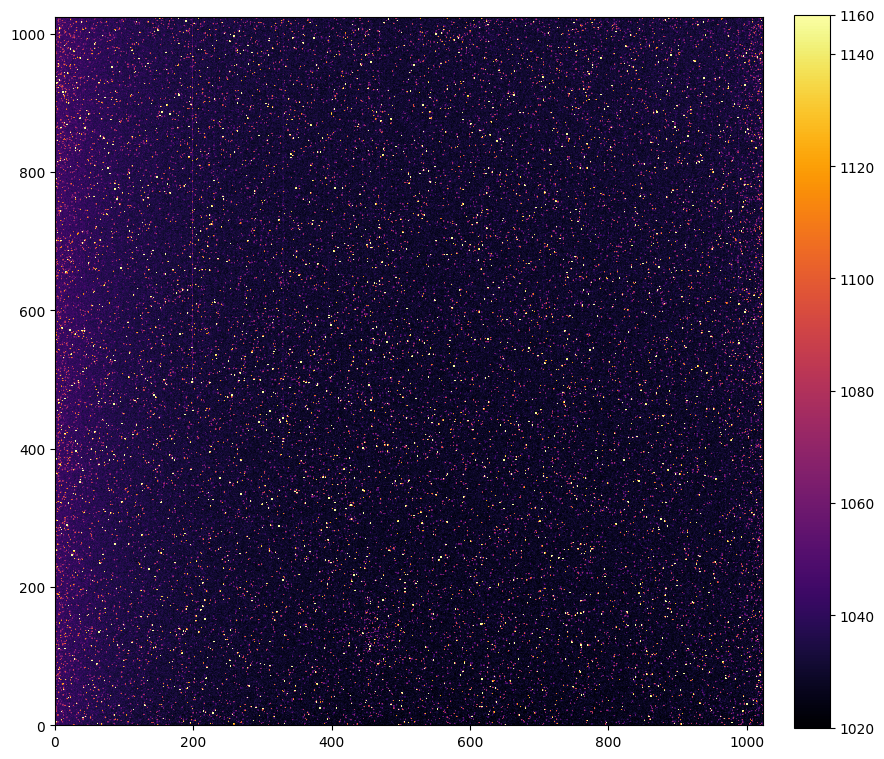

In [ ]:
#Master Dark Frame
dark_image = CCDData.read('master_dark_frame_30s.DARK.FIT', unit='adu')
show_image(dark_image.data, cmap='inferno')

[]

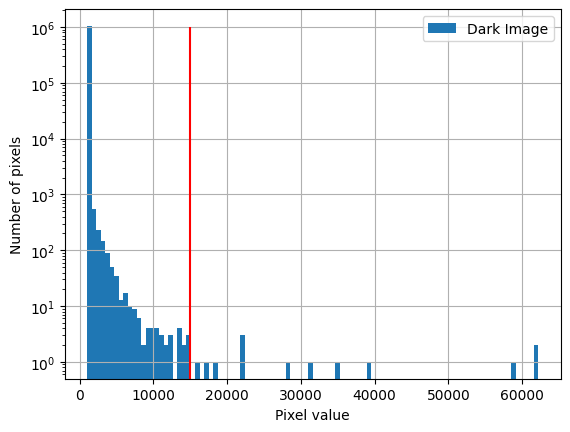

In [ ]:
#Plot Master Dark Image Histogram
dark0 = dark_image.data.flatten()
hist(dark0, bins=100, label='Dark Image')
plt.grid()
plt.vlines(15000,0,1e6, colors='red')
plt.legend()
plt.xlabel('Pixel value')
plt.ylabel('Number of pixels')
plt.semilogy() #y-axis in log-scale

[]

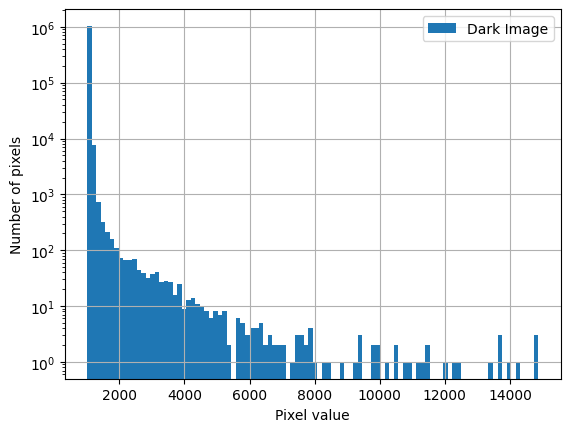

In [ ]:
#Plot Cut Histogram
dark_cut0 = dark0[dark0<15000]
hist(dark_cut0, bins=100, label='Dark Image')
plt.grid()
plt.legend()
plt.xlabel('Pixel value')
plt.ylabel('Number of pixels')
plt.semilogy() #y-axis in log-scale

In [ ]:
ccd11 = CCDData.read('dark_frame_10s.05.DARK.FIT', unit='adu')
dark_10s = ccd11.data.flatten()
dark_10s_cut = dark_10s[dark_10s < 15000]
dark_30s = ccd10.data.flatten()
dark_30s_cut = dark_30s[dark_30s < 15000]
ccd12 = CCDData.read('dark_frame_60s.16.DARK.FIT', unit='adu')
dark_60s = ccd12.data.flatten()
dark_60s_cut = dark_60s[dark_60s < 15000]
ccd13 = CCDData.read('dark_frame_90s.17.DARK.FIT', unit='adu')
dark_90s = ccd13.data.flatten()
dark_90s_cut = dark_90s[dark_90s < 15000]
ccd14 = CCDData.read('dark_frame_120s.18.DARK.FIT', unit='adu')
dark_120s = ccd14.data.flatten()
dark_120s_cut = dark_120s[dark_120s < 15000]

In [ ]:
#Mean, Standard Deviation and Uncertainity for 10s Dark Frame
mean10 = np.mean(dark_10s_cut)
std10 = np.std(dark_10s_cut)
uncert10 = std10/(np.sqrt(1024**2))
print(f'The mean of the data is: {mean10}')
print(f'The standard deviation of the data is: {std10}')
print(f'The uncertainity of the data is: {uncert10}')

The mean of the data is: 1016.6903954231132
The standard deviation of the data is: 43.874405847985756
The uncertainity of the data is: 0.04284609946092359


In [ ]:
#Mean, Standard Deviation and Uncertainity for 60s Dark Frame
mean60 = np.mean(dark_60s_cut)
std60 = np.std(dark_60s_cut)
uncert60 = std60/(np.sqrt(1024**2))
print(f'The mean of the data is: {mean60}')
print(f'The standard deviation of the data is: {std60}')
print(f'The uncertainity of the data is: {uncert60}')

The mean of the data is: 1062.4348267285184
The standard deviation of the data is: 141.38562569891172
The uncertainity of the data is: 0.13807190009659348


In [ ]:
#Mean, Standard Deviation and Uncertainity for 90s Dark Frame
mean90 = np.mean(dark_90s_cut)
std90 = np.std(dark_90s_cut)
uncert90 = std90/(np.sqrt(1024**2))
print(f'The mean of the data is: {mean90}')
print(f'The standard deviation of the data is: {std90}')
print(f'The uncertainity of the data is: {uncert90}')

The mean of the data is: 1089.553274709344
The standard deviation of the data is: 181.85343252655036
The uncertainity of the data is: 0.17759124270170934


In [ ]:
mean30 = np.mean(dark_30s_cut)
std30 = np.std(dark_30s_cut)
uncert30 = std30/1024

In [ ]:
#Mean, Standard Deviation and Uncertainity for 120s Dark Frame
mean120 = np.mean(dark_120s_cut)
std120 = np.std(dark_120s_cut)
uncert120 = std120/(np.sqrt(1024**2))
print(f'The mean of the data is: {mean120}')
print(f'The standard deviation of the data is: {std120}')
print(f'The uncertainity of the data is: {uncert120}')

The mean of the data is: 1115.7015448681325
The standard deviation of the data is: 213.62654431281496
The uncertainity of the data is: 0.20861967218048336


In [ ]:
#create an array of each dark frame
mean_counts = np.array([mean, mean10, mean30, mean60, mean90, mean120])
print(mean_counts)
#create an array of each exposure time
exp_time = np.array([0, 10, 30, 60, 90, 120]) 
print(exp_time)

[1010.14034884 1016.69039542 1035.52157145 1062.43482673 1089.55327471
 1115.70154487]
[  0  10  30  60  90 120]


1008.9943566861658 0.8905671674047515


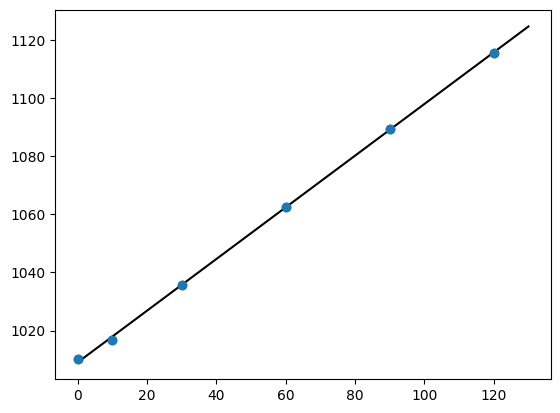

In [ ]:
#make a scatter plot of the mean counts versus the exposure time
plt.scatter(exp_time, mean_counts)
b, a = np.polyfit(exp_time, mean_counts, deg=1)
xseq = np.linspace(0, 130, 6)
plt.plot(xseq, a + b * xseq, color="k", lw=1.5)
#create an array of the uncertainty values
yerr = np.array([uncert, uncert10, uncert60, uncert60, uncert90, uncert120])
#add error bars into the plot
plt.errorbar(exp_time, mean_counts, yerr = yerr, fmt='o')
print(a,b)

<ErrorbarContainer object of 3 artists>

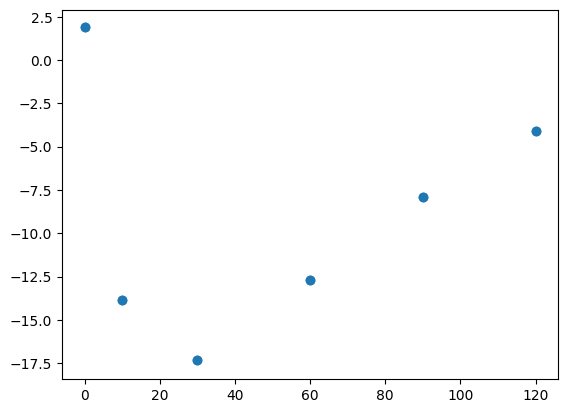

In [ ]:
def residual(a,b, xseq):
    return mean_counts - (a + b * xseq)

plt.scatter(exp_time, residual(1008.2142894895652,0.8582815152075286, xseq))
yerr = np.array([uncert, uncert10, uncert60, uncert60, uncert90, uncert120])
plt.errorbar(exp_time, residual(1008.2142894895652,0.8582815152075286, xseq), yerr = yerr, fmt='o')

In [ ]:
#Dark Current 
dark_current = 2.06 * b
print(dark_current)

1.834568364853788


In [2]:
#Flat-field Images
flat1 = CCDData.read('flat_fields_frame.00000005.FIT', unit='adu')
flat2 = CCDData.read('flat_fields_frame.00000006.FIT', unit='adu')
flat3 = CCDData.read('flat_fields_frame.00000007.FIT', unit='adu')
flat4 = CCDData.read('flat_fields_frame.00000008.FIT', unit='adu')
flat5 = CCDData.read('flat_fields_frame.00000009.FIT', unit='adu')
flat6 = CCDData.read('flat_fields_frame.00000010.FIT', unit='adu')
flat7 = CCDData.read('flat_fields_frame.00000011.FIT', unit='adu')
flat8 = CCDData.read('flat_fields_frame.00000012.FIT', unit='adu')
flat9 = CCDData.read('flat_fields_frame.00000013.FIT', unit='adu')
flat10 = CCDData.read('flat_fields_frame.00000014.FIT', unit='adu')

combiner_flats = Combiner([flat1, flat2, flat3, flat4, flat5, flat6, flat7, flat8, flat9, flat10])
combined_median_flats = np.array(combiner_flats.median_combine())
mean_flats = np.mean(combined_median_flats)
print(mean_flats)
normed = combined_median_flats/mean_flats
print(normed)

36493.49365520477


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [3]:
hdu_flats = fits.PrimaryHDU(normed)
hdul_flats = fits.HDUList([hdu_flats])
hdu_flats.writeto('normed_master_flat.FIT')

OSError: File normed_master_flat.FIT already exists. If you mean to replace it then use the argument "overwrite=True".

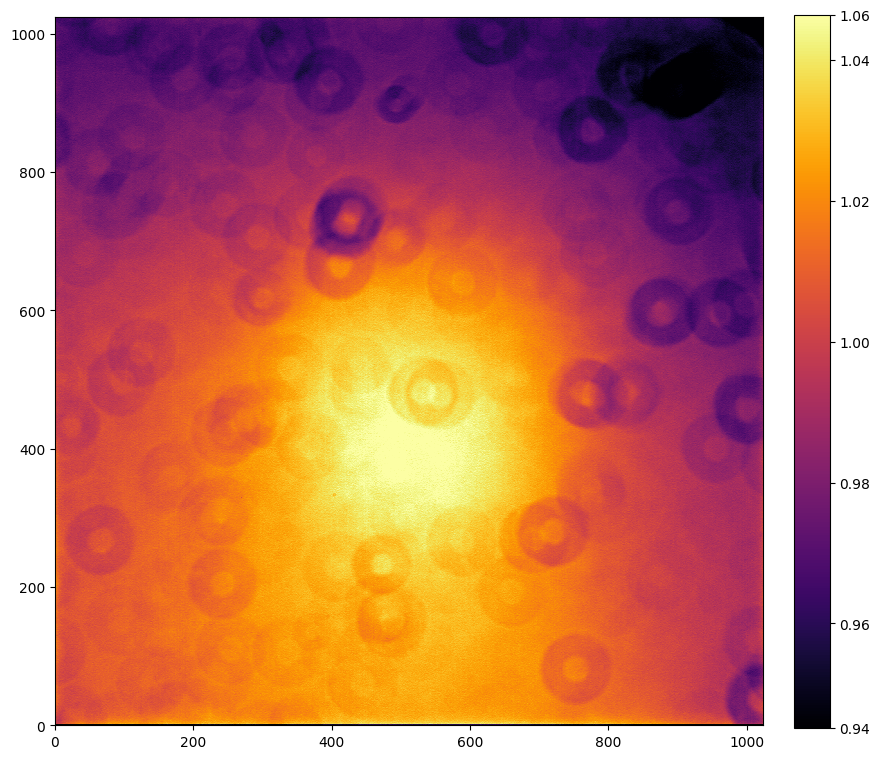

In [4]:
#Master Dark Frame
flat_image = CCDData.read('normed_master_flat.FIT', unit='adu')
show_image(flat_image.data, cmap='inferno')

Text(0, 0.5, 'Number of pixels')

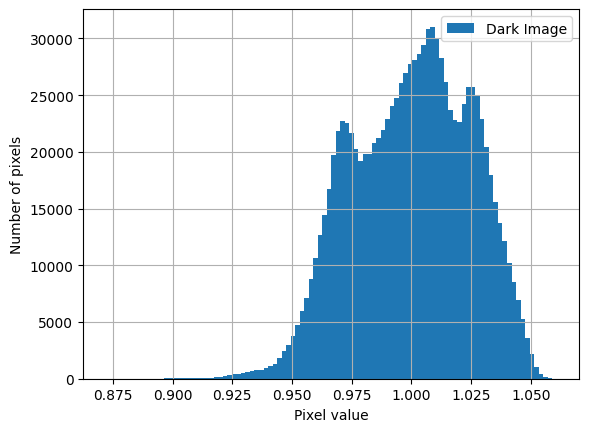

In [5]:
hist(flat_image.data.flatten(), bins=100, label='Dark Image')
plt.grid()
plt.legend()
plt.xlabel('Pixel value')
plt.ylabel('Number of pixels')

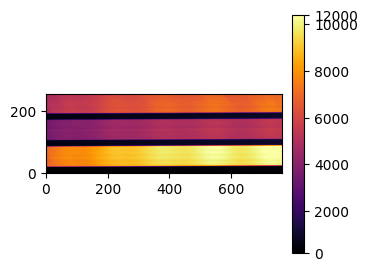

In [6]:
# 4.4.2
flat_spectro = CCDData.read('flat_fields.00000007.FIT', unit='adu')
show_image(flat_spectro.data, cmap='inferno')

In [7]:
flat_spectro = flat_spectro.data[106:176, :]

In [8]:
np.shape(flat_spectro)

(70, 765)

In [9]:
hdu_flats2 = fits.PrimaryHDU(flat_spectro)
hdul_flats2 = fits.HDUList([hdu_flats2])
hdu_flats2.writeto('cut_spec.FIT')

OSError: File cut_spec.FIT already exists. If you mean to replace it then use the argument "overwrite=True".

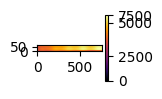

In [10]:
spec_image = CCDData.read('cut_spec.FIT', unit='adu')
show_image(spec_image.data, cmap='inferno')

In [11]:
np.size(spec_image.data.flatten())

53550

In [12]:
new = np.median(spec_image.data, axis = 0)
print(np.size(new))

765


In [13]:
x_pos = np.linspace(1,765,765)
print(np.size(x_pos))

765


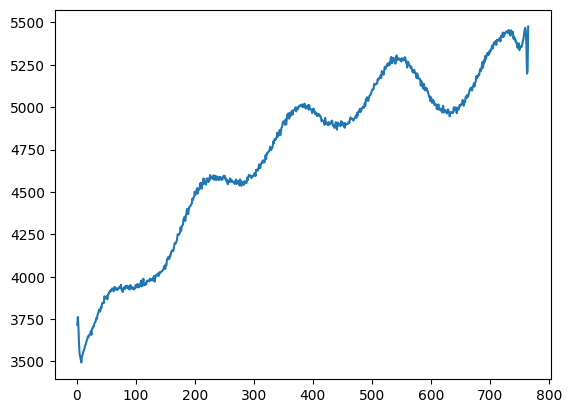

In [14]:
plt.plot(x_pos,new)

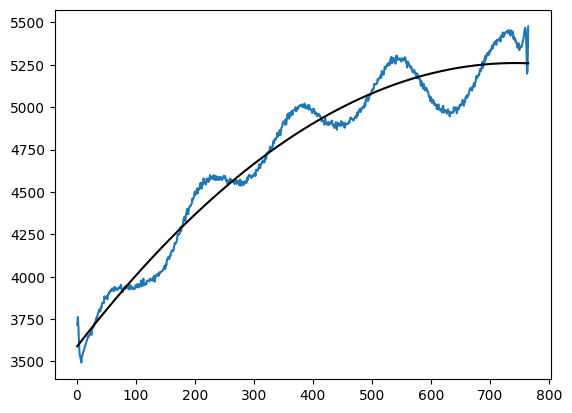

In [15]:
a, b, c = np.polyfit(x_pos, new, deg=2)
xseq = np.linspace(1, 765, 765)
plt.plot(x_pos,new)
plt.plot(x_pos, a * xseq **2 + b*xseq + c, color="k", lw=1.5)

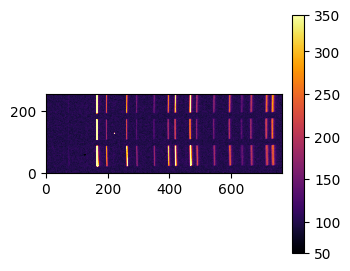

In [16]:
flat_arclamp = CCDData.read('arc_lamp_spectrum.00000002.FIT', unit='adu')
show_image(flat_arclamp.data, cmap='inferno')

In [17]:
flat_arclamp = flat_arclamp.data[106:176, :]

In [18]:
np.shape(flat_arclamp)

(70, 765)

In [19]:
hdu_flats2 = fits.PrimaryHDU(flat_arclamp)
hdul_flats2 = fits.HDUList([hdu_flats2])
hdu_flats2.writeto('cut_arclamp.FIT')

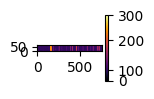

In [5]:
arclamp_image = CCDData.read('cut_arclamp.FIT', unit='adu')
show_image(arclamp_image.data, cmap='inferno')

In [21]:
print(np.size(arclamp_image.data))
normed_spec = arclamp_image.data/(a * xseq **2 + b*xseq + c)

53550


In [22]:
hdu_flats3= fits.PrimaryHDU(normed_spec)
hdul_flats3 = fits.HDUList([hdu_flats3])
hdu_flats3.writeto('cut_arclamp_normed.FIT')

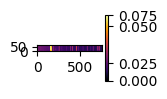

In [23]:
cut_arclamp_normed = CCDData.read('cut_arclamp_normed.FIT', unit='adu')
show_image(cut_arclamp_normed.data, cmap='inferno')

In [2]:
#Combining 10 dark images with 30s exposure time and finding median
saturn_bdark1 = CCDData.read('saturn_blue_darks.00000040.DARK.FIT', unit='adu')
saturn_bdark2 = CCDData.read('saturn_blue_darks.00000041.DARK.FIT', unit='adu')
saturn_bdark3 = CCDData.read('saturn_blue_darks.00000042.DARK.FIT', unit='adu')
saturn_bdark4 = CCDData.read('saturn_blue_darks.00000043.DARK.FIT', unit='adu')
saturn_bdark5 = CCDData.read('saturn_blue_darks.00000044.DARK.FIT', unit='adu')
saturn_bdark6 = CCDData.read('saturn_blue_darks.00000045.DARK.FIT', unit='adu')
saturn_bdark7 = CCDData.read('saturn_blue_darks.00000046.DARK.FIT', unit='adu')
saturn_bdark8 = CCDData.read('saturn_blue_darks.00000047.DARK.FIT', unit='adu')
saturn_bdark9 = CCDData.read('saturn_blue_darks.00000048.DARK.FIT', unit='adu')
saturn_bdark10 = CCDData.read('saturn_blue_darks.00000049.DARK.FIT', unit='adu')

combiner2 = Combiner([saturn_bdark1, saturn_bdark2, saturn_bdark3, saturn_bdark4, saturn_bdark5, saturn_bdark6, saturn_bdark7,
                     saturn_bdark8, saturn_bdark9, saturn_bdark10])
combined_median2 = np.array(combiner2.median_combine())

In [3]:
#Making new FIT file from median array
hdu = fits.PrimaryHDU(combined_median2)
hdul = fits.HDUList([hdu])
hdu.writeto('saturn_master_bdark1.DARK.FIT')

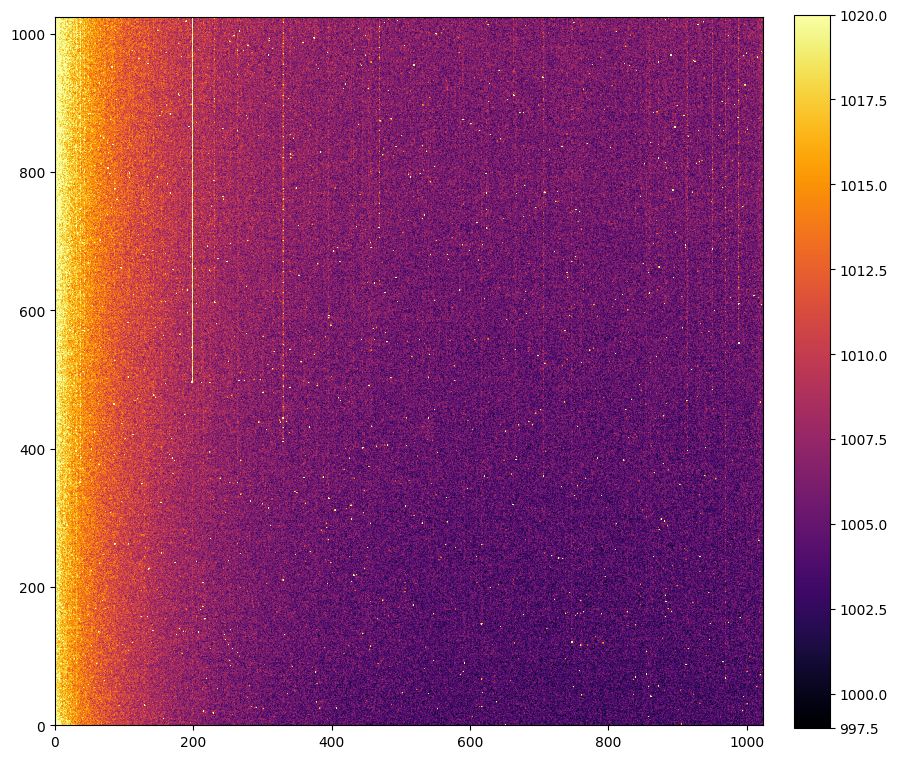

In [4]:
#Master Blue Dark Frame
dark_blue = CCDData.read('saturn_master_bdark1.DARK.FIT', unit='adu')
show_image(dark_blue.data, cmap='inferno')

In [5]:
#Combining 10 dark images with 30s exposure time and finding median
saturn_vdark1 = CCDData.read('saturn_visible_darks.00000010.DARK.FIT', unit='adu')
saturn_vdark2 = CCDData.read('saturn_visible_darks.00000011.DARK.FIT', unit='adu')
saturn_vdark3 = CCDData.read('saturn_visible_darks.00000012.DARK.FIT', unit='adu')
saturn_vdark4 = CCDData.read('saturn_visible_darks.00000013.DARK.FIT', unit='adu')
saturn_vdark5 = CCDData.read('saturn_visible_darks.00000014.DARK.FIT', unit='adu')
saturn_vdark6 = CCDData.read('saturn_visible_darks.00000015.DARK.FIT', unit='adu')
saturn_vdark7 = CCDData.read('saturn_visible_darks.00000016.DARK.FIT', unit='adu')
saturn_vdark8 = CCDData.read('saturn_visible_darks.00000017.DARK.FIT', unit='adu')
saturn_vdark9 = CCDData.read('saturn_visible_darks.00000018.DARK.FIT', unit='adu')
saturn_vdark10 = CCDData.read('saturn_visible_darks.00000019.DARK.FIT', unit='adu')

combiner3 = Combiner([saturn_vdark1, saturn_vdark2, saturn_vdark3, saturn_vdark4, saturn_vdark5, saturn_vdark6, saturn_vdark7,
                     saturn_vdark8, saturn_vdark9, saturn_vdark10])
combined_median3 = np.array(combiner3.median_combine())

In [6]:
#Making new FIT file from median array
hdu = fits.PrimaryHDU(combined_median3)
hdul = fits.HDUList([hdu])
hdu.writeto('saturn_master_vdark1.DARK.FIT')

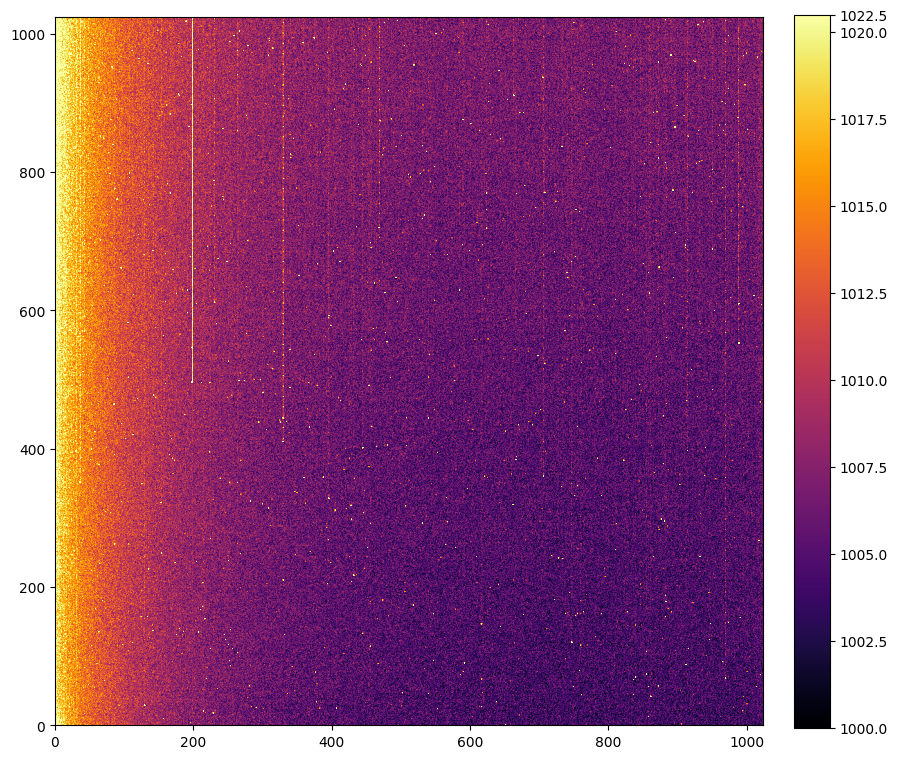

In [7]:
#Master Blue Dark Frame
dark_visible = CCDData.read('saturn_master_vdark1.DARK.FIT', unit='adu')
show_image(dark_visible.data, cmap='inferno')

In [8]:
#Combining 10 dark images with 30s exposure time and finding median
saturn_blue1 = CCDData.read('saturn_blue.00000030.FIT', unit='adu')
saturn_blue2 = CCDData.read('saturn_blue.00000031.FIT', unit='adu')
saturn_blue3 = CCDData.read('saturn_blue.00000032.FIT', unit='adu')
saturn_blue4 = CCDData.read('saturn_blue.00000033.FIT', unit='adu')
saturn_blue5 = CCDData.read('saturn_blue.00000034.FIT', unit='adu')
saturn_blue6 = CCDData.read('saturn_blue.00000035.FIT', unit='adu')
saturn_blue7 = CCDData.read('saturn_blue.00000036.FIT', unit='adu')
saturn_blue8 = CCDData.read('saturn_blue.00000037.FIT', unit='adu')
saturn_blue9 = CCDData.read('saturn_blue.00000038.FIT', unit='adu')
saturn_blue10 = CCDData.read('saturn_blue.00000039.FIT', unit='adu')

combiner4 = Combiner([saturn_blue1, saturn_blue2, saturn_blue3, saturn_blue4, saturn_blue5, saturn_blue6, saturn_blue7,
                     saturn_blue8, saturn_blue9, saturn_blue10])
combined_median4 = np.array(combiner4.median_combine())

In [9]:
#Making new FIT file from median array
hdu = fits.PrimaryHDU(combined_median4)
hdul = fits.HDUList([hdu])
hdu.writeto('master_saturn_blue1.FIT')

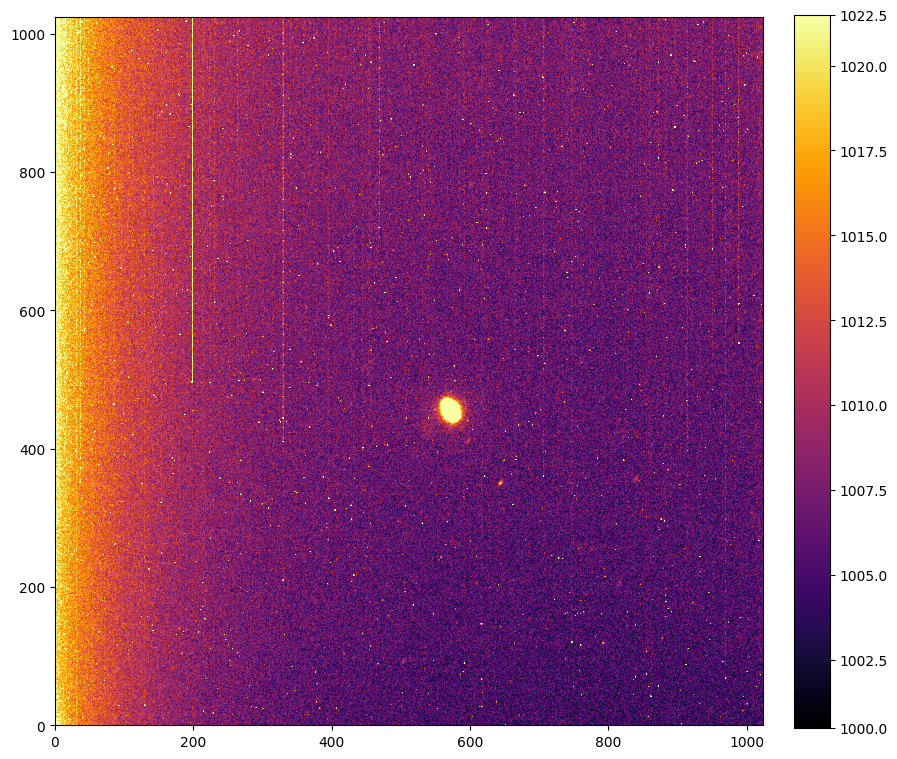

In [10]:
#Master Blue Dark Frame
saturn_blue = CCDData.read('master_saturn_blue1.FIT', unit='adu')
show_image(saturn_blue.data, cmap='inferno')

In [11]:
#Combining 10 dark images with 30s exposure time and finding median
saturn_visible1 = CCDData.read('saturn_visible.00000000.FIT', unit='adu')
saturn_visible2 = CCDData.read('saturn_visible.00000001.FIT', unit='adu')
saturn_visible3 = CCDData.read('saturn_visible.00000002.FIT', unit='adu')
saturn_visible4 = CCDData.read('saturn_visible.00000003.FIT', unit='adu')
saturn_visible5 = CCDData.read('saturn_visible.00000004.FIT', unit='adu')
saturn_visible6 = CCDData.read('saturn_visible.00000005.FIT', unit='adu')
saturn_visible7 = CCDData.read('saturn_visible.00000006.FIT', unit='adu')
saturn_visible8 = CCDData.read('saturn_visible.00000007.FIT', unit='adu')
saturn_visible9 = CCDData.read('saturn_visible.00000008.FIT', unit='adu')
saturn_visible10 = CCDData.read('saturn_visible.00000009.FIT', unit='adu')

combiner5 = Combiner([saturn_visible1, saturn_visible2, saturn_visible3, saturn_visible4, saturn_visible5, saturn_visible6, saturn_visible7,
                     saturn_visible8, saturn_visible9, saturn_visible10])
combined_median5 = np.array(combiner5.median_combine())

In [12]:
#Making new FIT file from median array
hdu = fits.PrimaryHDU(combined_median5)
hdul = fits.HDUList([hdu])
hdu.writeto('master_saturn_visible.FIT')

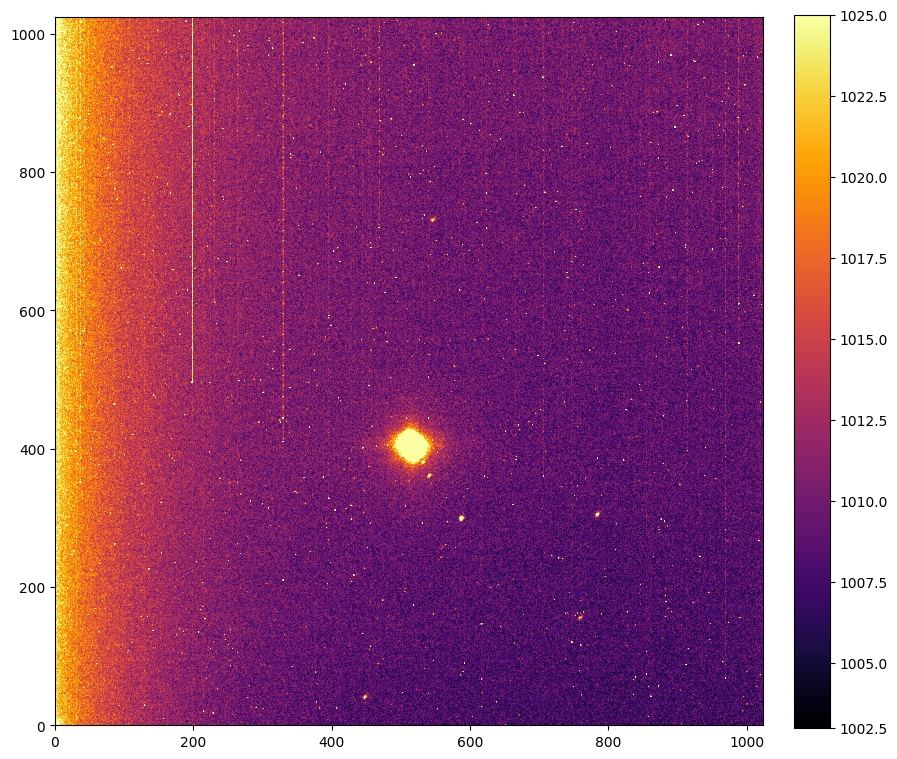

In [13]:
#Master Blue Dark Frame
saturn_visible = CCDData.read('master_saturn_visible.FIT', unit='adu')
show_image(saturn_visible.data, cmap='inferno')

In [ ]:
ccd1 = CCDData.read('saturn_red.00000020.FIT', unit='adu')
ccd2 = CCDData.read('saturn_red.00000021.FIT', unit='adu')
ccd3 = CCDData.read('saturn_red.00000022.FIT', unit='adu')
ccd4 = CCDData.read('saturn_red.00000023.FIT', unit='adu')
ccd5 = CCDData.read('saturn_red.00000024.FIT', unit='adu')
ccd6 = CCDData.read('saturn_red.00000025.FIT', unit='adu')
ccd7 = CCDData.read('saturn_red.00000026.FIT', unit='adu')
ccd8 = CCDData.read('saturn_red.00000027.FIT', unit='adu')
ccd9 = CCDData.read('saturn_red.00000028.FIT', unit='adu')
ccd10 = CCDData.read('saturn_red.00000029.FIT', unit='adu')

combiner = Combiner([ccd1, ccd2, ccd3, ccd4, ccd5, ccd6, ccd7, ccd8, ccd9, ccd10])
combined_median = np.array(combiner.median_combine())

In [ ]:
hdu = fits.PrimaryHDU(combined_median)
hdul = fits.HDUList([hdu])
hdu.writeto('master_red_frame_100s.FIT')

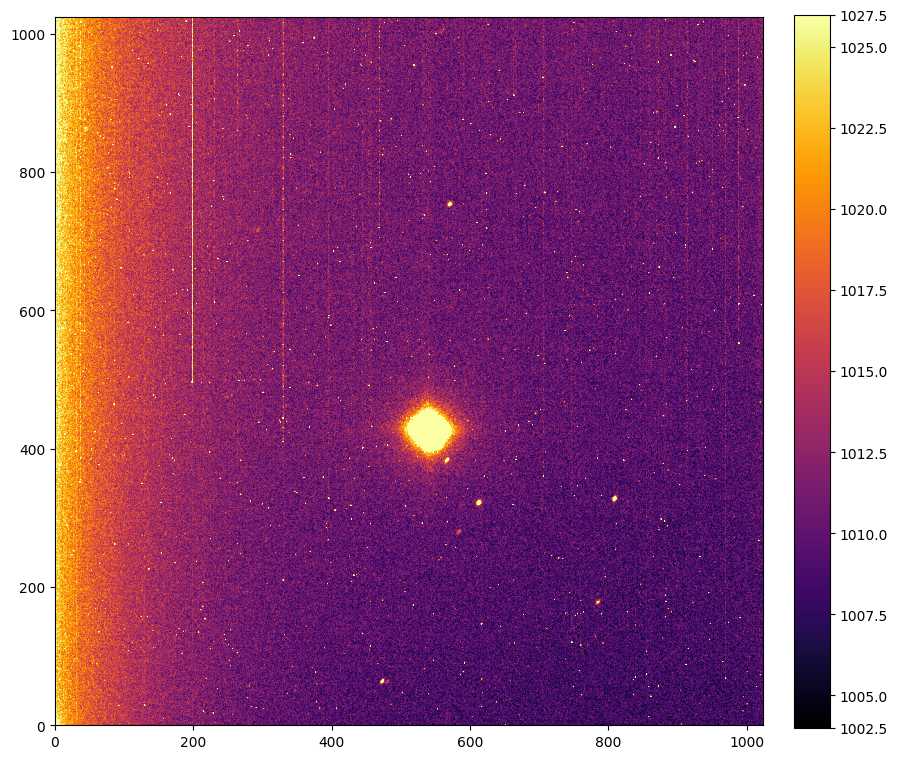

In [14]:
red_image = CCDData.read('master_red_frame_100s.FIT', unit='adu')
show_image(red_image.data, cmap='inferno')

In [29]:
image_1 = ('master_red_frame_100s.FIT')
image_2 = ('master_saturn_blue1.FIT')
image_3 = ('master_saturn_visible.FIT')
image_list = ([image_1, image_2, image_3])

In [34]:
image_concat = [fits.getdata(i) for i in image_list]
stacked = np.sum(image_concat, axis=0)

(1024, 1024)


In [35]:
hdu_stacked = fits.PrimaryHDU(stacked)
hdul_stacked = fits.HDUList([hdu_stacked])
hdu_stacked.writeto('stacked.FIT')

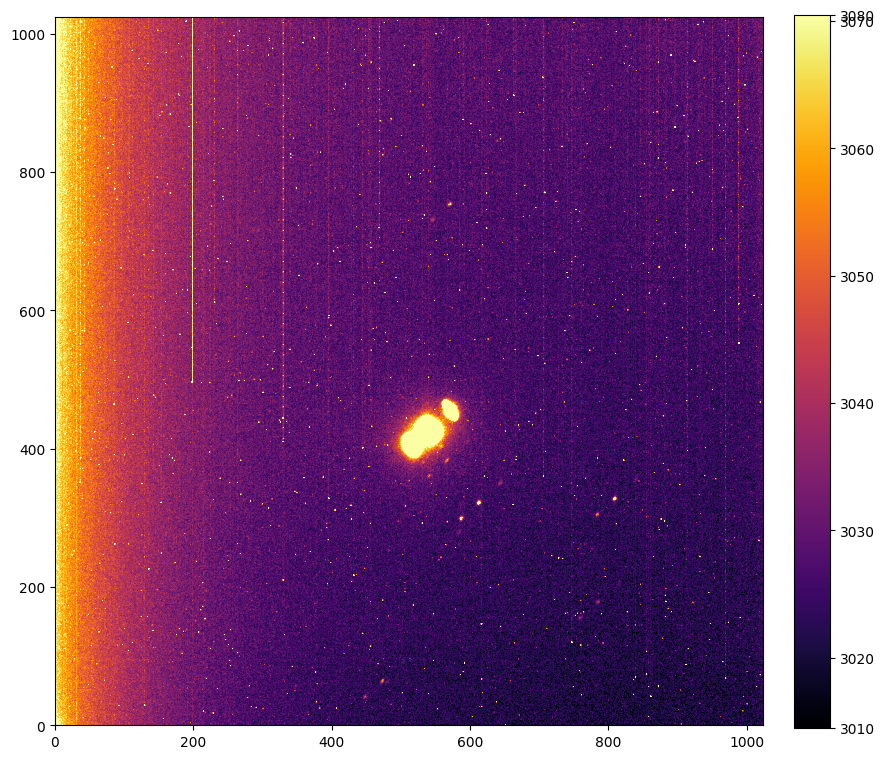

In [36]:
stacked_image = CCDData.read('stacked.FIT', unit='adu')
show_image(stacked_image.data, cmap='inferno')

In [42]:
from PIL import Image
import astroalign as aa
source = Image.open("master_red_frame_100s.FIT")
target = Image.open("master_saturn_blue1.FIT")
registered, footprint = aa.register(source, target)

ValueError: Reference stars in target image are less than the minimum value (3).

In [41]:
import astroalign as aa
registered_image, footprint = aa.register(red_image, saturn_visible)

ValueError: Big-endian buffer not supported on little-endian compiler